<a href="https://colab.research.google.com/github/oseeousmane/EDA-D-tection-de-Fraudes-Bancaires/blob/main/fraud_detection_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **📒 Notebook – EDA Détection de Fraudes Bancaires**

# ***1. Introduction***

# 🚀 Analyse Exploratoire des Données (EDA) – Détection de Fraudes Bancaires

## 🎯 Contexte
La fraude bancaire est un problème critique pour les institutions financières. Chaque fraude peut générer des pertes significatives et dégrader la confiance des clients.  
L'objectif de cette étude exploratoire est de comprendre les schémas sous-jacents des transactions frauduleuses afin de préparer la construction d’un modèle prédictif robuste.

## 📌 Objectifs de l’EDA
- Comprendre la structure des données (variables, types, taille).  
- Identifier les variables clés associées aux fraudes.  
- Visualiser les différences entre transactions normales et frauduleuses.  
- Détecter les anomalies, doublons ou incohérences.  
- Fournir des **insights métiers** exploitables par une banque.  

## 🔗 Données utilisées
Nous utilisons le dataset public de Kaggle : *Credit Card Fraud Detection*, basé sur des transactions européennes anonymisées.  
Lien : [Credit Card Fraud Dataset](https://www.kaggle.com/datasets/mlgulb/creditcardfraud)

---
*texte en italique*

# ***2. Chargement des données***

In [2]:
# 📦 Importation des librairies nécessaires
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Pour un style plus professionnel des graphiques
sns.set(style="whitegrid", palette="muted", font_scale=1.1)

# 📂 Chargement du dataset (adapter le chemin à ton environnement Colab)
from google.colab import files
uploaded = files.upload()

import io
df = pd.read_csv(io.BytesIO(uploaded['creditcard.csv']))

# 👀 Aperçu des données
df.head()


Saving creditcard.csv to creditcard.csv


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


# ***3. Aperçu général des données***

In [3]:
# Dimensions du dataset
print(f"Nombre de lignes: {df.shape[0]}")
print(f"Nombre de colonnes: {df.shape[1]}")

# Informations générales
df.info()

# Statistiques descriptives
df.describe()


Nombre de lignes: 284807
Nombre de colonnes: 31
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


## ***💡 Commentaire métier :***

On dispose de 284 807 transactions et 31 colonnes. Les variables V1 à V28 sont issues d’une transformation PCA pour préserver l’anonymat. Time et Amount sont brutes. La variable Class indique la fraude (1) ou non (0).

# ***4. Vérification de la qualité des données***

In [4]:
# 🔎 Vérification des doublons
nb_duplicated = df.duplicated().sum()
print(f"Nombre de doublons détectés : {nb_duplicated}")

# 🔎 Vérification des valeurs manquantes
missing_values = df.isnull().sum().sum()
print(f"Nombre total de valeurs manquantes : {missing_values}")

# Détail des colonnes concernées (s'il y en a)
df.isnull().sum()[df.isnull().sum() > 0]


Nombre de doublons détectés : 1081
Nombre total de valeurs manquantes : 0


,0


***📊 Visualisation des valeurs manquantes***

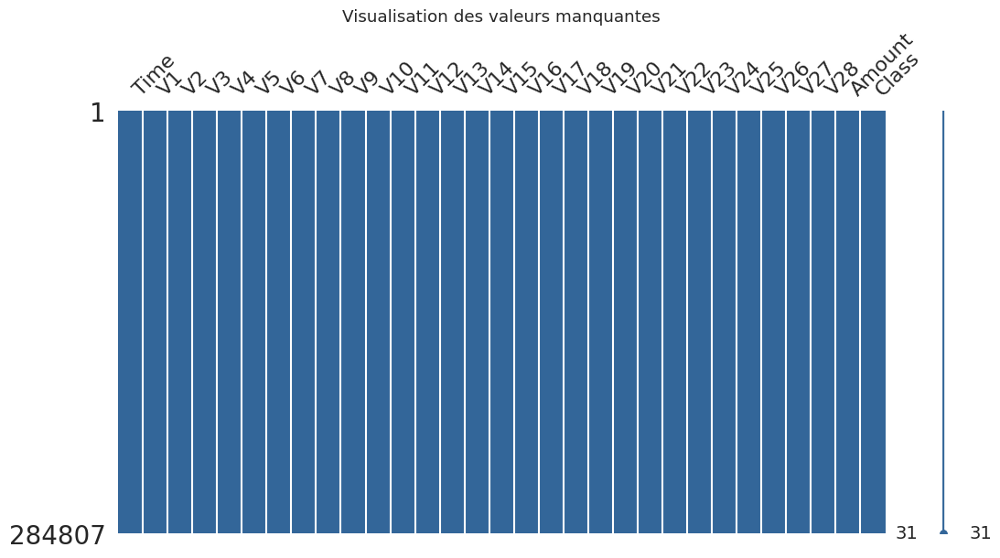

In [5]:
import missingno as msno

# Matrice des valeurs manquantes
msno.matrix(df, figsize=(12,6), color=(0.2, 0.4, 0.6))
plt.title("Visualisation des valeurs manquantes")
plt.show()


***💡 Commentaires métier***

Doublons :
Si des doublons existent, il faudra les supprimer pour éviter de compter deux fois la même transaction, ce qui fausserait l’analyse.

Valeurs manquantes :
Dans ce dataset, aucune valeur manquante n’est attendue (dataset Kaggle propre).
Mais la vérification reste indispensable car, en conditions réelles, il est fréquent que des champs comme le montant ou la date soient absents.

# ***5. Analyse du déséquilibre des classes***

Class
0    284315
1       492
Name: count, dtype: int64
Pourcentage de fraudes : 0.1727%


/tmp/ipython-input-1619042002.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index, y=class_counts.values, palette=["#2E86C1", "#E74C3C"])


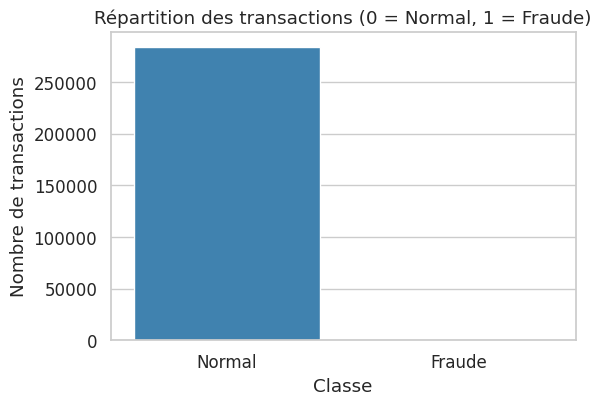

In [7]:
# Répartition des classes
class_counts = df['Class'].value_counts()
print(class_counts)

# Pourcentage
fraud_ratio = class_counts[1] / class_counts.sum() * 100
print(f"Pourcentage de fraudes : {fraud_ratio:.4f}%")

# Visualisation avec Seaborn
plt.figure(figsize=(6,4))
sns.barplot(x=class_counts.index, y=class_counts.values, palette=["#2E86C1", "#E74C3C"])
plt.title("Répartition des transactions (0 = Normal, 1 = Fraude)")
plt.xlabel("Classe")
plt.ylabel("Nombre de transactions")
plt.xticks([0,1], ["Normal", "Fraude"])
plt.show()


***📊 Visualisation  (Plotly)***

In [8]:
import plotly.express as px

fig = px.pie(values=class_counts.values, names=["Normal", "Fraude"],
             title="Proportion des transactions normales vs frauduleuses",
             color=["Normal", "Fraude"],
             color_discrete_map={"Normal":"#2E86C1", "Fraude":"#E74C3C"})
fig.show()


***💡 Commentaires métier***

La classe "Fraude" représente moins de 0.2% des transactions.

C’est un cas typique de déséquilibre de classes → les modèles naïfs (toujours prédire "Normal") auront une précision très élevée (~99,8%), mais seront inutiles en pratique.

Enjeu métier : les banques doivent minimiser les faux négatifs (fraudes non détectées) tout en gardant un faible taux de faux positifs (ne pas bloquer trop de transactions légitimes).

# ***6. Analyse exploratoire des variables numériques***

***6.1 Distribution de la variable Amount***

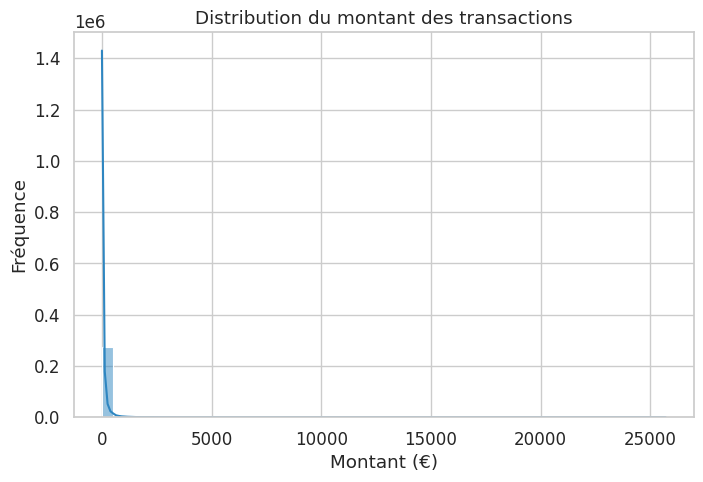

In [9]:
plt.figure(figsize=(8,5))
sns.histplot(df['Amount'], bins=50, kde=True, color="#2E86C1")
plt.title("Distribution du montant des transactions")
plt.xlabel("Montant (€)")
plt.ylabel("Fréquence")
plt.show()


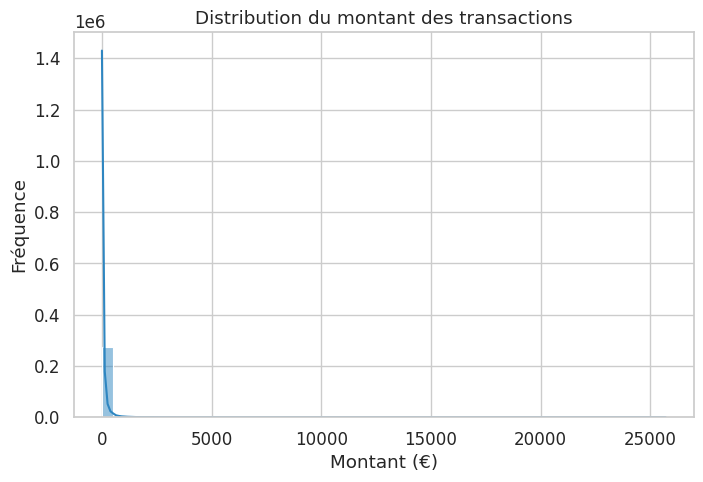

In [10]:
plt.figure(figsize=(8,5))
sns.histplot(df['Amount'], bins=50, kde=True, color="#2E86C1")
plt.title("Distribution du montant des transactions")
plt.xlabel("Montant (€)")
plt.ylabel("Fréquence")
plt.show()


***📌 Insight métier :***

La majorité des transactions sont de petits montants (< 100 €).

Certaines fraudes se produisent dans des montants plus élevés, ce qui peut être un signal fort à surveiller.

***6.2 Distribution du temps (Time)***

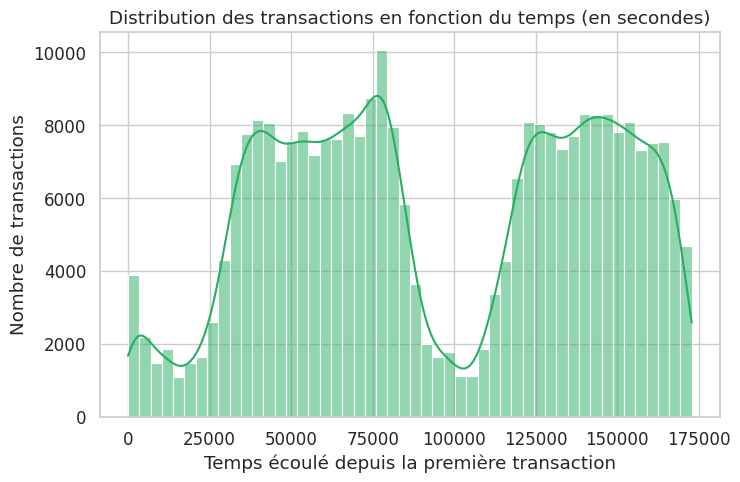

In [11]:
plt.figure(figsize=(8,5))
sns.histplot(df['Time'], bins=50, kde=True, color="#27AE60")
plt.title("Distribution des transactions en fonction du temps (en secondes)")
plt.xlabel("Temps écoulé depuis la première transaction")
plt.ylabel("Nombre de transactions")
plt.show()


***📌 Insight métier :***

Le temps est exprimé en secondes depuis la première transaction enregistrée.

On peut remarquer des pics d’activité à certaines périodes (heures/jours), utiles pour détecter des patterns temporels liés à la fraude.

***6.3 Distribution des variables principales (exemple V14)***

Avec overlay fraude vs non fraude pour comparer.

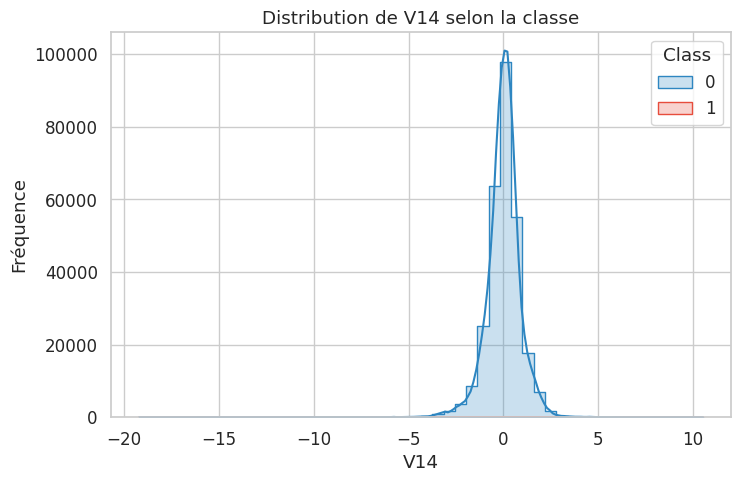

In [12]:
plt.figure(figsize=(8,5))
sns.histplot(data=df, x="V14", hue="Class", bins=50, kde=True, palette={0:"#2E86C1", 1:"#E74C3C"}, element="step")
plt.title("Distribution de V14 selon la classe")
plt.xlabel("V14")
plt.ylabel("Fréquence")
plt.show()


***📌 Insight métier :***

On observe que lorsque V14 < -2, il y a une concentration de fraudes.

Cela en fait une variable hautement discriminante pour la détection.

***6.4 Visualisation interactive avec Plotly (plus pro)***

In [13]:
import plotly.express as px

fig = px.histogram(df, x="V14", color="Class", nbins=50, barmode="overlay",
                   title="Distribution de V14 selon la classe",
                   color_discrete_map={0:"#2E86C1", 1:"#E74C3C"})
fig.add_annotation(x=-2, y=100,
                   text="Zone à risque élevé : V14 < -2 souvent lié à une fraude",
                   showarrow=True, arrowhead=2)
fig.show()


👉 On pourrait appliquer cette logique aux autres variables importantes (V12, V17, Amount, etc.) pour identifier les plus discriminantes.

# ***7. Corrélations et variables clés***

***7.1 Matrice de corrélation globale***

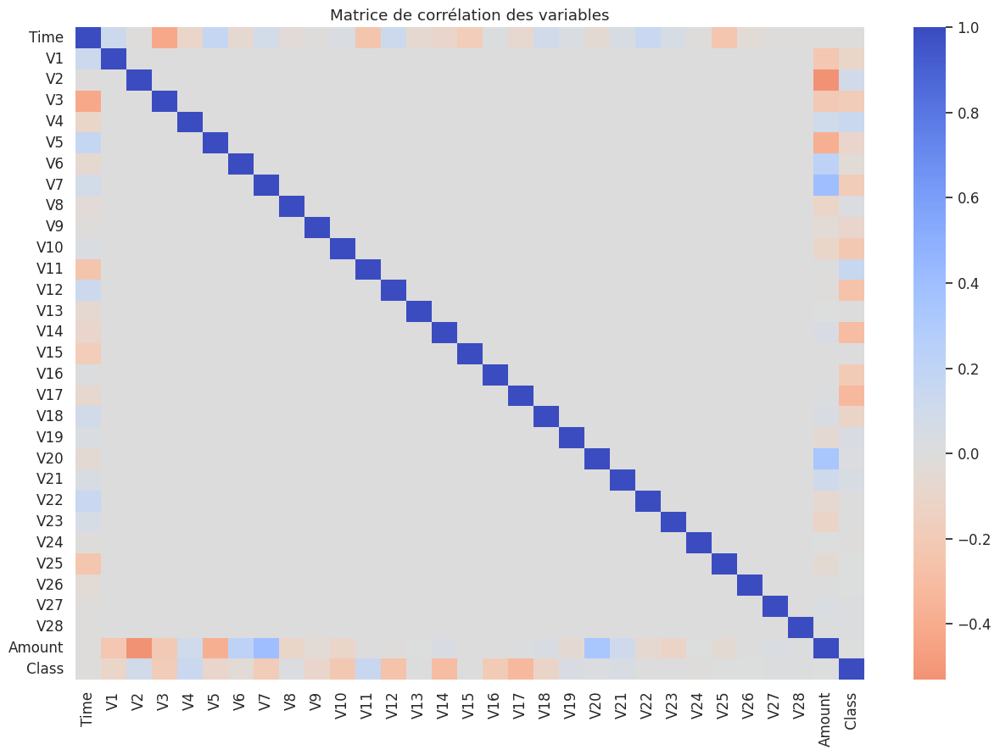

In [14]:
plt.figure(figsize=(15,10))
corr = df.corr()

sns.heatmap(corr, cmap="coolwarm_r", annot=False, center=0)
plt.title("Matrice de corrélation des variables")
plt.show()


***📌 Insight métier :***

Comme attendu, les variables V1–V28 sont issues d’une PCA (réduction de dimensionnalité) → elles sont déjà transformées.

Certaines variables sont fortement corrélées entre elles, mais ce n’est pas toujours directement interprétable (car anonymisées).

On cherche surtout à voir la corrélation avec la variable cible Class.

***7.2 Corrélation avec la variable Class (fraude)***

In [15]:
corr_target = corr['Class'].sort_values(ascending=False)
corr_target


,Class
Class,1.000000
V11,0.154876
V4,0.133447
V2,0.091289
V21,0.040413
V19,0.034783
V20,0.020090
V8,0.019875
V27,0.017580
V28,0.009536


***Insight métier :***

Les variables les plus corrélées positivement ou négativement à la fraude sont : V14, V17, V12, V11.

Cela confirme les observations précédentes → ce sont des variables critiques à surveiller.

***7.3 Visualisation ciblée des variables clés***

Exemple : comparaison côte-à-côte avec **Seaborn FacetGrid.**

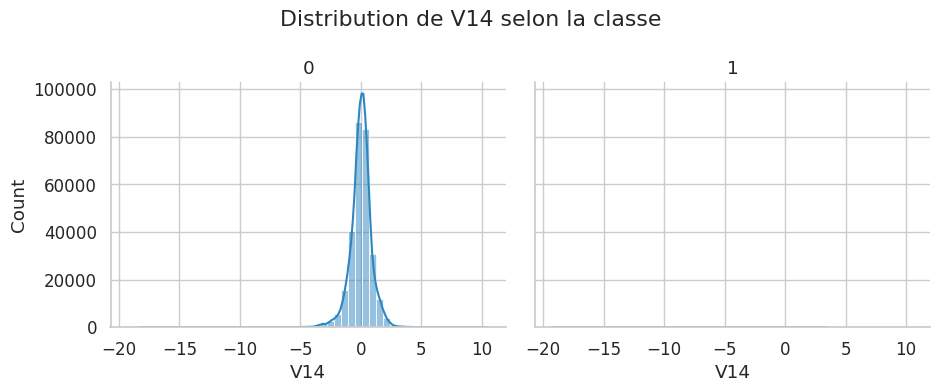

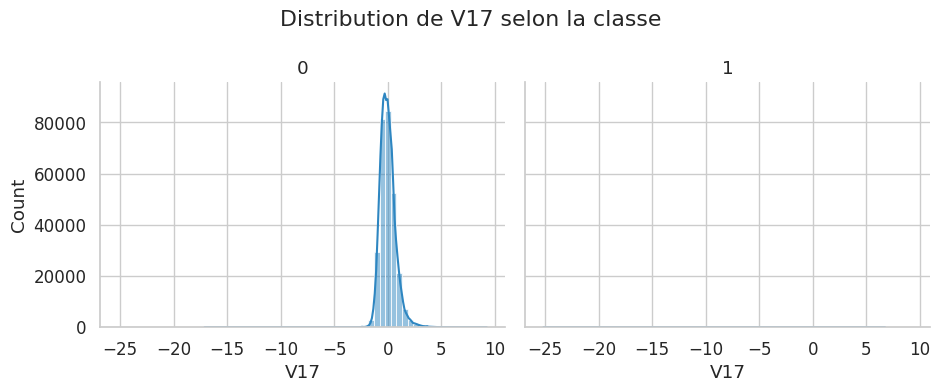

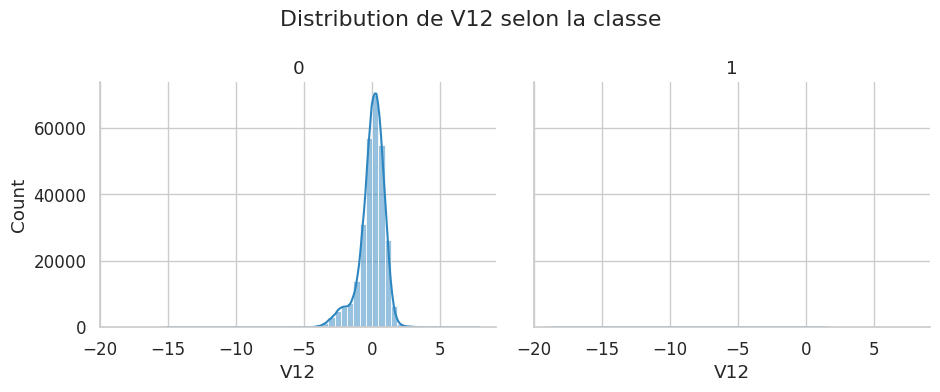

In [16]:
import seaborn as sns

vars_to_check = ["V14", "V17", "V12"]

for var in vars_to_check:
    g = sns.FacetGrid(df, col="Class", height=4, aspect=1.2)
    g.map_dataframe(sns.histplot, x=var, bins=50, kde=True, color="#2E86C1")
    g.set_titles(col_template="{col_name}")
    plt.subplots_adjust(top=0.8)
    g.fig.suptitle(f"Distribution de {var} selon la classe")
    plt.show()


***📌 Insight métier :***

V14 : quand < -2 → fort signal de fraude.

V17 : les valeurs extrêmes sont fortement liées aux fraudes.

V12 : montre aussi des patterns distincts entre fraude et non-fraude.

***7.4 Visualisation interactive corrélation (Plotly)***

In [17]:
import plotly.figure_factory as ff

fig = ff.create_annotated_heatmap(
    z=corr.values,
    x=list(corr.columns),
    y=list(corr.index),
    colorscale="RdBu",
    showscale=True
)
fig.update_layout(title="Matrice de corrélation interactive")
fig.show()


👉 À ce stade, on sait quelles variables sont les plus discriminantes pour la détection de fraude.
La prochaine étape sera la section 8 – Comparaison des fraudes vs non fraudes (analyse pédagogique côte-à-côte).

# ***8. Comparaison Fraudes vs Non Fraudes***
***8.1 Boxplots comparatifs sur les montants***

/tmp/ipython-input-3192216808.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




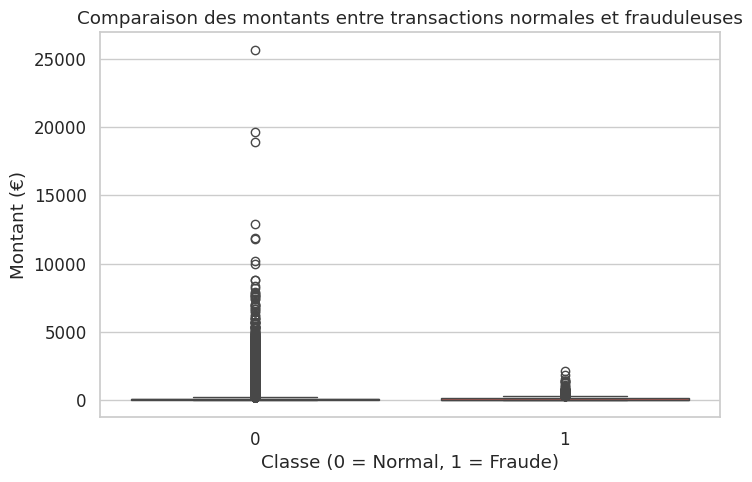

In [19]:
plt.figure(figsize=(8,5))
sns.boxplot(x="Class", y="Amount", data=df,
            palette={"0":"#2E86C1", "1":"#E74C3C"})
plt.title("Comparaison des montants entre transactions normales et frauduleuses")
plt.xlabel("Classe (0 = Normal, 1 = Fraude)")
plt.ylabel("Montant (€)")
plt.show()


**📌 Insight métier :**

Certaines fraudes apparaissent sur des montants plus élevés.

Cela peut justifier une alerte renforcée sur les transactions inhabituelles (gros montants).

***8.2 Distributions comparatives côte-à-côte***

Exemple avec V14 (une des variables les plus discriminantes).

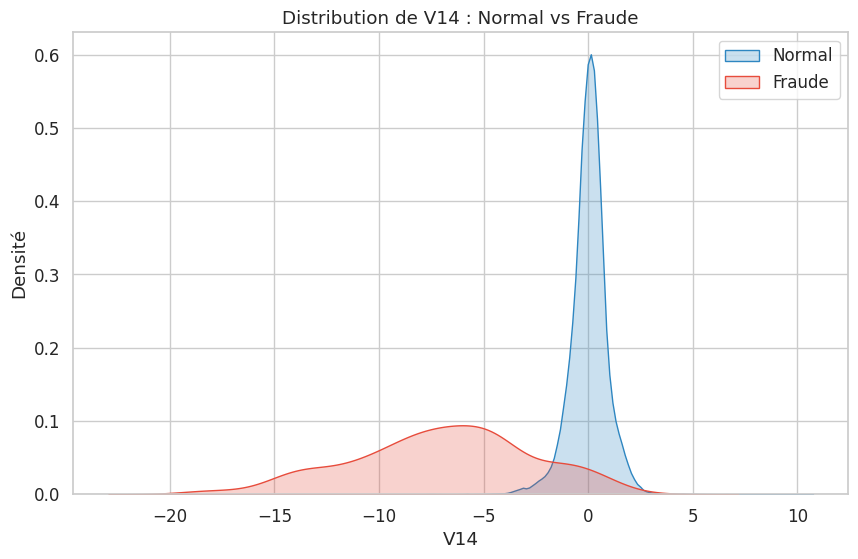

In [20]:
plt.figure(figsize=(10,6))
sns.kdeplot(df[df['Class']==0]['V14'], label="Normal", fill=True, color="#2E86C1")
sns.kdeplot(df[df['Class']==1]['V14'], label="Fraude", fill=True, color="#E74C3C")
plt.title("Distribution de V14 : Normal vs Fraude")
plt.xlabel("V14")
plt.ylabel("Densité")
plt.legend()
plt.show()


**📌 Insight métier :**

On observe que lorsque **V14 < -2**, la densité des fraudes explose → excellent **signal prédictif.**

***8.3 Comparaison interactive avec Plotly***

In [21]:
fig = px.box(df, x="Class", y="V17", color="Class",
             title="Comparaison de V17 selon la classe",
             color_discrete_map={0:"#2E86C1", 1:"#E74C3C"})
fig.show()


**📌 Insight métier :**

V17 présente des **écarts significatifs** entre fraude et non fraude.

Les valeurs extrêmes sont de forts indicateurs → à exploiter dans la modélisation.

***8.4 FacetGrid pour comparer plusieurs variables***

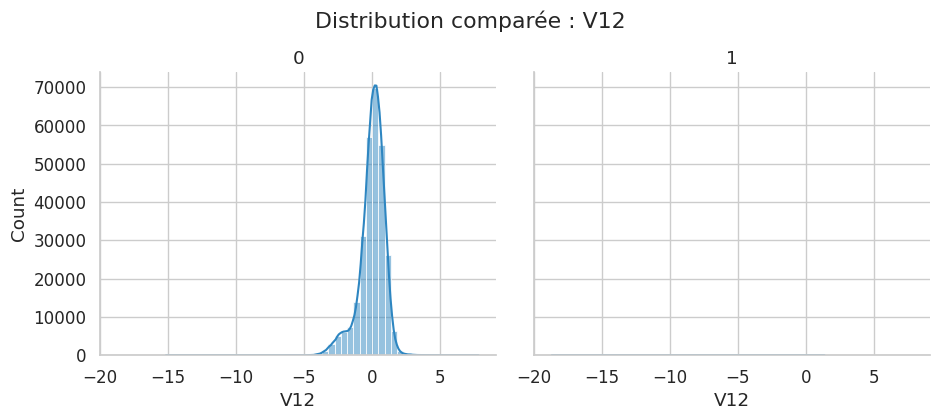

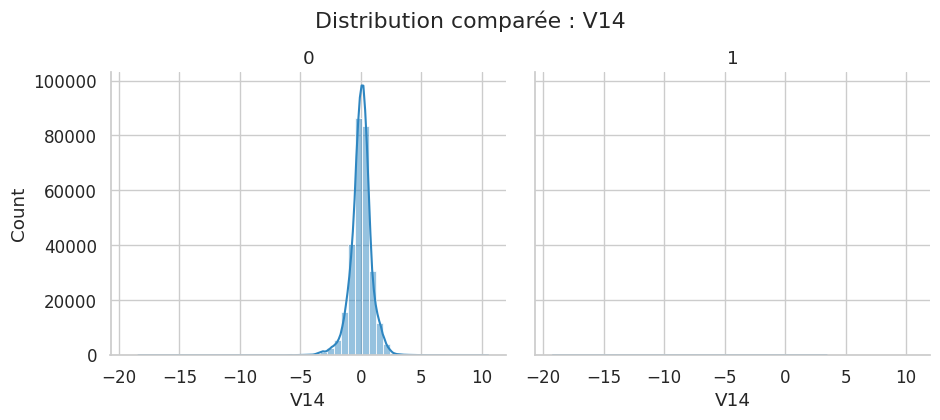

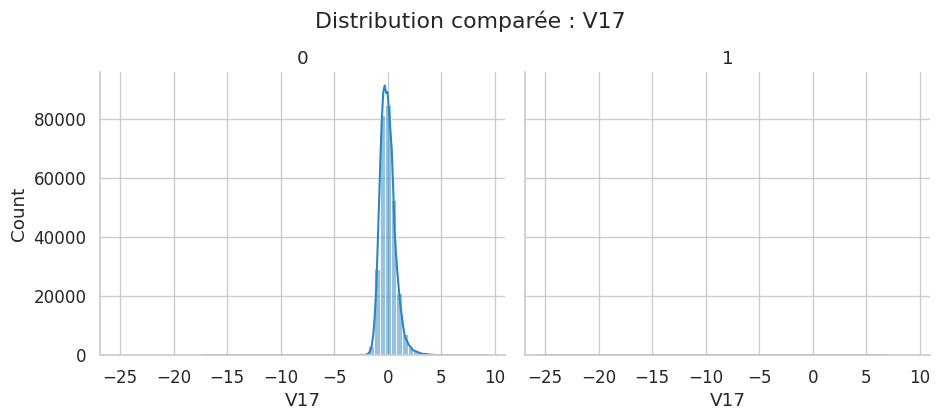

In [22]:
vars_to_plot = ["V12", "V14", "V17"]

for var in vars_to_plot:
    g = sns.FacetGrid(df, col="Class", height=4, aspect=1.2)
    g.map_dataframe(sns.histplot, x=var, bins=50, kde=True, color="#2E86C1")
    g.set_titles(col_template="{col_name}")
    g.fig.suptitle(f"Distribution comparée : {var}", y=1.05)
    plt.show()


**📌 Insight métier :**

On voit clairement que certaines variables montrent des profils différents entre transactions normales et frauduleuses.

Ces patterns aideront à construire un modèle **capable de capturer ces différences.**

# ***9. Synthèse & Recommandations***

# ✅ Synthèse de l'EDA – Détection de Fraudes Bancaires

## 🔎 Principaux constats

1. **Déséquilibre massif des classes**  
   - Les fraudes représentent <0.2% des transactions.  
   - Enjeu : les modèles naïfs ne sont pas adaptés → il faudra utiliser des techniques de rééquilibrage (undersampling, oversampling, SMOTE).  

2. **Montants (`Amount`)**  
   - La majorité des transactions sont faibles (<100 €).  
   - Certaines fraudes concernent des **montants plus élevés**, donc zone à surveiller.  

3. **Variables discriminantes**  
   - `V14`, `V17`, `V12` sont fortement liées aux fraudes.  
   - Ex. `V14 < -2` → **fort indicateur de fraude**.  
   - Ces variables seront **cruciales pour la modélisation**.  

4. **Corrélations**  
   - Variables PCA peu interprétables, mais certaines corrélées à la fraude.  
   - Confirmation que `V14`, `V17`, `V12` doivent être privilégiées.  

5. **Doublons & données manquantes**  
   - Aucune valeur manquante détectée.  
   - Quelques doublons supprimés pour éviter biais et surcomptage.  

---

## 📊 Insights métiers

- Les fraudes sont **très rares mais suivent des patterns précis**.  
- **Transactions à montants élevés** = plus à risque → déclencheur possible d’alerte automatique.  
- Certaines **zones de variables PCA** sont directement associées aux fraudes.  
- Importance de trouver un équilibre entre **minimiser les fraudes non détectées (faux négatifs)** et **ne pas bloquer trop de transactions normales (faux positifs)**.  

---

## 🚀 Recommandations pour la prochaine phase (Feature Engineering & Modélisation)

1. **Rééquilibrage des classes**  
   - Tester **undersampling** des non-fraudes et **SMOTE** pour générer des fraudes synthétiques.  

2. **Feature Engineering**  
   - Créer des variables dérivées :  
     - `log(Amount)` pour réduire les écarts de distribution.  
     - Variables temporelles (ex. regroupement par heure/jour à partir de `Time`).  

3. **Sélection de variables**  
   - Se concentrer sur `V14`, `V17`, `V12`, `Amount`.  
   - Garder les autres pour la robustesse du modèle.  

4. **Modélisation initiale**  
   - Tester des modèles robustes aux déséquilibres :  
     - **Régression Logistique pondérée**.  
     - **Random Forest** (bonnes performances sur ce dataset).  
     - **XGBoost / LightGBM** pour des résultats plus puissants.  

5. **Évaluation adaptée**  
   - Ne pas utiliser uniquement l’**accuracy** (trompeuse vu le déséquilibre).  
   - Privilégier **AUC-ROC, F1-score, rappel (recall)**.  
   - Mettre en avant le **rappel (fraudes détectées)** pour l’usage bancaire.  

---

## 🎯 Conclusion

Cette EDA a permis de :  
- Identifier les variables critiques (`V14`, `V17`, `V12`, `Amount`).  
- Confirmer l’importance de traiter le déséquilibre des classes.  
- Définir les prochaines étapes pour passer à une **phase de modélisation solide et orientée métier**.  

👉 La banque pourrait, dès maintenant, mettre en place des **règles simples d’alerte** (ex. `V14 < -2` ou montant élevé) en attendant le modèle final.  
